## Step 0: Set up environment


In [ ]:
!git clone https://github.com/ActiveVisionLab/nerfmm.git

Cloning into 'nerfmm'...
remote: Enumerating objects: 100, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 100 (delta 2), reused 1 (delta 0), pack-reused 94
Receiving objects: 100% (100/100), 82.80 MiB | 12.50 MiB/s, done.
Resolving deltas: 100% (19/19), done.


In [ ]:
import os, random, datetime
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import imageio
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from IPython.display import Image
from google.colab import files

Set random seeds for the entire session.

In [ ]:
random.seed(17)
np.random.seed(17)
torch.manual_seed(17)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
from nerfmm.utils.pos_enc import encode_position
from nerfmm.utils.volume_op import volume_rendering, volume_sampling_ndc
from nerfmm.utils.comp_ray_dir import comp_ray_dir_cam_fxfy

# utlities
from nerfmm.utils.training_utils import mse2psnr
from nerfmm.utils.lie_group_helper import convert3x4_4x4

## UPLOAD IMAGES

In [ ]:
import os
from google.colab import files

try:
    !rm -rf 'custom_upload'

    uploaded = files.upload()
    up_file_name = list(uploaded.keys())[0]
    print('Uploaded file "{name}" with size ~{length} MB'.format(name=up_file_name, length=len(uploaded[up_file_name])/1e6))

    !mv $up_file_name 'custom_upload.zip'
    !unzip 'custom_upload.zip' -d 'custom_upload'
    !rm 'custom_upload.zip'
    image_dir = os.path.join('custom_upload', os.listdir('custom_upload')[0])
    print('Upload and unzip done.')
except:
    print('Seems like upload failed. Please retry.')
    image_dir = None

if image_dir is None:
    print('No custom input provided. Please upload a valid file.')
else:
    scene_name = 'custom_upload'
    print('Selected scene:', scene_name)


Saving 1.degrade.zip to 1.degrade.zip
Uploaded file "1.degrade.zip" with size ~64.117301 MB
Archive:  custom_upload.zip
  inflating: custom_upload/1.degrade/frame_0.png  
  inflating: custom_upload/1.degrade/frame_1.png  
  inflating: custom_upload/1.degrade/frame_10.png  
  inflating: custom_upload/1.degrade/frame_11.png  
  inflating: custom_upload/1.degrade/frame_12.png  
  inflating: custom_upload/1.degrade/frame_13.png  
  inflating: custom_upload/1.degrade/frame_14.png  
  inflating: custom_upload/1.degrade/frame_15.png  
  inflating: custom_upload/1.degrade/frame_16.png  
  inflating: custom_upload/1.degrade/frame_17.png  
  inflating: custom_upload/1.degrade/frame_18.png  
  inflating: custom_upload/1.degrade/frame_19.png  
  inflating: custom_upload/1.degrade/frame_2.png  
  inflating: custom_upload/1.degrade/frame_20.png  
  inflating: custom_upload/1.degrade/frame_21.png  
  inflating: custom_upload/1.degrade/frame_22.png  
  inflating: custom_upload/1.degrade/frame_23.png  

## Step 1b: Load images

<ipython-input-6-b5babcb90bd2>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(p)[:, :, :3]  # (H, W, 3) np.uint8


Loaded 60 imgs, resolution 1080 x 1920
torch.Size([60, 1080, 1920, 3])


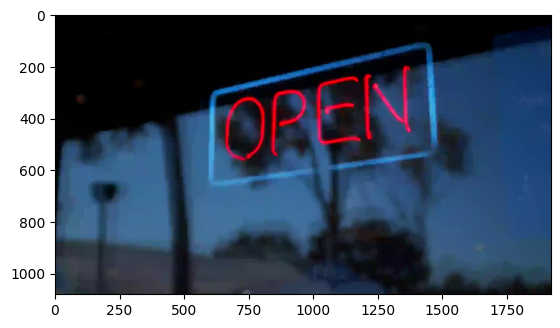

In [ ]:
def load_imgs(image_dir):
    img_names = np.array(sorted(os.listdir(image_dir)))  # all image names
    img_paths = [os.path.join(image_dir, n) for n in img_names]
    N_imgs = len(img_paths)

    img_list = []
    for p in img_paths:
        img = imageio.imread(p)[:, :, :3]  # (H, W, 3) np.uint8
        img_list.append(img)
    img_list = np.stack(img_list)  # (N, H, W, 3)
    img_list = torch.from_numpy(img_list).float() / 255  # (N, H, W, 3) torch.float32
    H, W = img_list.shape[1], img_list.shape[2]

    results = {
        'imgs': img_list,  # (N, H, W, 3) torch.float32
        'img_names': img_names,  # (N, )
        'N_imgs': N_imgs,
        'H': H,
        'W': W,
    }
    return results

image_data = load_imgs(image_dir)
imgs = image_data['imgs']  # (N, H, W, 3) torch.float32

N_IMGS = image_data['N_imgs']
H = image_data['H']
W = image_data['W']

print('Loaded {0} imgs, resolution {1} x {2}'.format(N_IMGS, H, W))
print(imgs.shape)
plt.imshow(imgs[0])

## Step 2a: Define learnable FOCALS

We initialise $f_x = W$ and $f_y = H$.



In [ ]:
class LearnFocal(nn.Module):
    def __init__(self, H, W, req_grad):
        super(LearnFocal, self).__init__()
        self.H = H
        self.W = W
        self.fx = nn.Parameter(torch.tensor(1.0, dtype=torch.float32), requires_grad=req_grad)  # (1, )
        self.fy = nn.Parameter(torch.tensor(1.0, dtype=torch.float32), requires_grad=req_grad)  # (1, )

    def forward(self):
        # order = 2, check our supplementary.
        fxfy = torch.stack([self.fx**2 * self.W, self.fy**2 * self.H])
        return fxfy

## Step 2b: Define learnable POSES



In [ ]:
def vec2skew(v):
    """
    :param v:  (3, ) torch tensor
    :return:   (3, 3)
    """
    zero = torch.zeros(1, dtype=torch.float32, device=v.device)
    skew_v0 = torch.cat([ zero,    -v[2:3],   v[1:2]])  # (3, 1)
    skew_v1 = torch.cat([ v[2:3],   zero,    -v[0:1]])
    skew_v2 = torch.cat([-v[1:2],   v[0:1],   zero])
    skew_v = torch.stack([skew_v0, skew_v1, skew_v2], dim=0)  # (3, 3)
    return skew_v  # (3, 3)


def Exp(r):
    """so(3) vector to SO(3) matrix
    :param r: (3, ) axis-angle, torch tensor
    :return:  (3, 3)
    """
    skew_r = vec2skew(r)  # (3, 3)
    norm_r = r.norm() + 1e-15
    eye = torch.eye(3, dtype=torch.float32, device=r.device)
    R = eye + (torch.sin(norm_r) / norm_r) * skew_r + ((1 - torch.cos(norm_r)) / norm_r**2) * (skew_r @ skew_r)
    return R


def make_c2w(r, t):
    """
    :param r:  (3, ) axis-angle             torch tensor
    :param t:  (3, ) translation vector     torch tensor
    :return:   (4, 4)
    """
    R = Exp(r)  # (3, 3)
    c2w = torch.cat([R, t.unsqueeze(1)], dim=1)  # (3, 4)
    c2w = convert3x4_4x4(c2w)  # (4, 4)
    return c2w


class LearnPose(nn.Module):
    def __init__(self, num_cams, learn_R, learn_t):
        super(LearnPose, self).__init__()
        self.num_cams = num_cams
        self.r = nn.Parameter(torch.zeros(size=(num_cams, 3), dtype=torch.float32), requires_grad=learn_R)  # (N, 3)
        self.t = nn.Parameter(torch.zeros(size=(num_cams, 3), dtype=torch.float32), requires_grad=learn_t)  # (N, 3)

    def forward(self, cam_id):
        r = self.r[cam_id]  # (3, ) axis-angle
        t = self.t[cam_id]  # (3, )
        c2w = make_c2w(r, t)  # (4, 4)
        return c2w

## Step 2c: Define a tiny NeRF


In [ ]:
class TinyNerf(nn.Module):
    def __init__(self, pos_in_dims, dir_in_dims, D):
        """
        :param pos_in_dims: scalar, number of channels of encoded positions
        :param dir_in_dims: scalar, number of channels of encoded directions
        :param D:           scalar, number of hidden dimensions
        """
        super(TinyNerf, self).__init__()

        self.pos_in_dims = pos_in_dims
        self.dir_in_dims = dir_in_dims

        self.layers0 = nn.Sequential(
            nn.Linear(pos_in_dims, D), nn.ReLU(),
            nn.Linear(D, D), nn.ReLU(),
            nn.Linear(D, D), nn.ReLU(),
            nn.Linear(D, D), nn.ReLU(),
        )

        self.fc_density = nn.Linear(D, 1)
        self.fc_feature = nn.Linear(D, D)
        self.rgb_layers = nn.Sequential(nn.Linear(D + dir_in_dims, D//2), nn.ReLU())
        self.fc_rgb = nn.Linear(D//2, 3)

        self.fc_density.bias.data = torch.tensor([0.1]).float()
        self.fc_rgb.bias.data = torch.tensor([0.02, 0.02, 0.02]).float()

    def forward(self, pos_enc, dir_enc):
        """
        :param pos_enc: (H, W, N_sample, pos_in_dims) encoded positions
        :param dir_enc: (H, W, N_sample, dir_in_dims) encoded directions
        :return: rgb_density (H, W, N_sample, 4)
        """
        x = self.layers0(pos_enc)  # (H, W, N_sample, D)
        density = self.fc_density(x)  # (H, W, N_sample, 1)

        feat = self.fc_feature(x)  # (H, W, N_sample, D)
        x = torch.cat([feat, dir_enc], dim=3)  # (H, W, N_sample, D+dir_in_dims)
        x = self.rgb_layers(x)  # (H, W, N_sample, D/2)
        rgb = self.fc_rgb(x)  # (H, W, N_sample, 3)

        rgb_den = torch.cat([rgb, density], dim=3)  # (H, W, N_sample, 4)
        return rgb_den

## Step 3: Training pipeline

### Set ray parameters

In [ ]:
class RayParameters():
    def __init__(self):
      self.NEAR, self.FAR = 0.0, 1.0  # ndc near far
      self.N_SAMPLE = 128  # samples per ray
      self.POS_ENC_FREQ = 10  # positional encoding freq for location
      self.DIR_ENC_FREQ = 4   # positional encoding freq for direction

ray_params = RayParameters()

### Define training function
During training, two key steps enable back-propagation:
1. Compute ray directions using estimated intrinsics online.
2. Sample the 3D volume using estimated poses and intrinsics online.

We highlight those two parts in their related comments with "KEY" keyword.

In [ ]:
def model_render_image(c2w, rays_cam, t_vals, ray_params, H, W, fxfy, nerf_model,
                       perturb_t, sigma_noise_std):
    """
    :param c2w:         (4, 4)                  pose to transform ray direction from cam to world.
    :param rays_cam:    (someH, someW, 3)       ray directions in camera coordinate, can be random selected
                                                rows and cols, or some full rows, or an entire image.
    :param t_vals:      (N_samples)             sample depth along a ray.
    :param perturb_t:   True/False              perturb t values.
    :param sigma_noise_std: float               add noise to raw density predictions (sigma).
    :return:            (someH, someW, 3)       volume rendered images for the input rays.
    """
    # KEY 2: sample the 3D volume using estimated poses and intrinsics online.
    # (H, W, N_sample, 3), (H, W, 3), (H, W, N_sam)
    sample_pos, _, ray_dir_world, t_vals_noisy = volume_sampling_ndc(c2w, rays_cam, t_vals, ray_params.NEAR,
                                                                     ray_params.FAR, H, W, fxfy, perturb_t)

    # encode position: (H, W, N_sample, (2L+1)*C = 63)
    pos_enc = encode_position(sample_pos, levels=ray_params.POS_ENC_FREQ, inc_input=True)

    # encode direction: (H, W, N_sample, (2L+1)*C = 27)
    ray_dir_world = F.normalize(ray_dir_world, p=2, dim=2)  # (H, W, 3)
    dir_enc = encode_position(ray_dir_world, levels=ray_params.DIR_ENC_FREQ, inc_input=True)  # (H, W, 27)
    dir_enc = dir_enc.unsqueeze(2).expand(-1, -1, ray_params.N_SAMPLE, -1)  # (H, W, N_sample, 27)

    # inference rgb and density using position and direction encoding.
    rgb_density = nerf_model(pos_enc, dir_enc)  # (H, W, N_sample, 4)

    render_result = volume_rendering(rgb_density, t_vals_noisy, sigma_noise_std, rgb_act_fn=torch.sigmoid)
    rgb_rendered = render_result['rgb']  # (H, W, 3)
    depth_map = render_result['depth_map']  # (H, W)

    result = {
        'rgb': rgb_rendered,  # (H, W, 3)
        'depth_map': depth_map,  # (H, W)
    }

    return result


def train_one_epoch(imgs, H, W, ray_params, opt_nerf, opt_focal,
                    opt_pose, nerf_model, focal_net, pose_param_net):
    nerf_model.train()
    focal_net.train()
    pose_param_net.train()

    t_vals = torch.linspace(ray_params.NEAR, ray_params.FAR, ray_params.N_SAMPLE, device='cuda')  # (N_sample,) sample position
    L2_loss_epoch = []

    # shuffle the training imgs
    ids = np.arange(N_IMGS)
    np.random.shuffle(ids)

    for i in ids:
        fxfy = focal_net()

        # KEY 1: compute ray directions using estimated intrinsics online.
        ray_dir_cam = comp_ray_dir_cam_fxfy(H, W, fxfy[0], fxfy[1])
        img = imgs[i].to('cuda')  # (H, W, 4)
        c2w = pose_param_net(i)  # (4, 4)

        # sample 32x32 pixel on an image and their rays for training.
        r_id = torch.randperm(H, device='cuda')[:32]  # (N_select_rows)
        c_id = torch.randperm(W, device='cuda')[:32]  # (N_select_cols)
        ray_selected_cam = ray_dir_cam[r_id][:, c_id]  # (N_select_rows, N_select_cols, 3)
        img_selected = img[r_id][:, c_id]  # (N_select_rows, N_select_cols, 3)

        # render an image using selected rays, pose, sample intervals, and the network
        render_result = model_render_image(c2w, ray_selected_cam, t_vals, ray_params,
                                           H, W, fxfy, nerf_model, perturb_t=True, sigma_noise_std=0.0)
        rgb_rendered = render_result['rgb']  # (N_select_rows, N_select_cols, 3)
        L2_loss = F.mse_loss(rgb_rendered, img_selected)  # loss for one image

        L2_loss.backward()
        opt_nerf.step()
        opt_focal.step()
        opt_pose.step()
        opt_nerf.zero_grad()
        opt_focal.zero_grad()
        opt_pose.zero_grad()

        L2_loss_epoch.append(L2_loss)

    L2_loss_epoch_mean = torch.stack(L2_loss_epoch).mean().item()
    return L2_loss_epoch_mean

### Define evaluation function



In [ ]:
def render_novel_view(c2w, H, W, fxfy, ray_params, nerf_model):
    nerf_model.eval()

    ray_dir_cam = comp_ray_dir_cam_fxfy(H, W, fxfy[0], fxfy[1])
    t_vals = torch.linspace(ray_params.NEAR, ray_params.FAR, ray_params.N_SAMPLE, device='cuda')  # (N_sample,) sample position

    c2w = c2w.to('cuda')  # (4, 4)

    # split an image to rows when the input image resolution is high
    rays_dir_cam_split_rows = ray_dir_cam.split(10, dim=0)  # input 10 rows each time
    rendered_img = []
    rendered_depth = []
    for rays_dir_rows in rays_dir_cam_split_rows:
        render_result = model_render_image(c2w, rays_dir_rows, t_vals, ray_params,
                                           H, W, fxfy, nerf_model,
                                           perturb_t=False, sigma_noise_std=0.0)
        rgb_rendered_rows = render_result['rgb']  # (num_rows_eval_img, W, 3)
        depth_map = render_result['depth_map']  # (num_rows_eval_img, W)

        rendered_img.append(rgb_rendered_rows)
        rendered_depth.append(depth_map)

    # combine rows to an image
    rendered_img = torch.cat(rendered_img, dim=0)  # (H, W, 3)
    rendered_depth = torch.cat(rendered_depth, dim=0)  # (H, W)
    return rendered_img, rendered_depth

## Step 4: Actual training



In [ ]:
N_EPOCH = 1000
EVAL_INTERVAL = 50

# Initialise all trainabled parameters
focal_net = LearnFocal(H, W, req_grad=True).cuda()
pose_param_net = LearnPose(num_cams=N_IMGS, learn_R=True, learn_t=True).cuda()

# Get a tiny NeRF model. Hidden dimension set to 128
nerf_model = TinyNerf(pos_in_dims=63, dir_in_dims=27, D=128).cuda()

# Set lr and scheduler: these are just stair-case exponantial decay lr schedulers.
opt_nerf = torch.optim.Adam(nerf_model.parameters(), lr=0.001)
opt_focal = torch.optim.Adam(focal_net.parameters(), lr=0.001)
opt_pose = torch.optim.Adam(pose_param_net.parameters(), lr=0.001)

from torch.optim.lr_scheduler import MultiStepLR
scheduler_nerf = MultiStepLR(opt_nerf, milestones=list(range(0, 10000, 10)), gamma=0.9954)
scheduler_focal = MultiStepLR(opt_focal, milestones=list(range(0, 10000, 100)), gamma=0.9)
scheduler_pose = MultiStepLR(opt_pose, milestones=list(range(0, 10000, 100)), gamma=0.9)

# Set tensorboard writer
writer = SummaryWriter(log_dir=os.path.join('logs', scene_name, str(datetime.datetime.now().strftime('%y%m%d_%H%M%S'))))

# Store poses to visualise them later
pose_history = []

# Define the directory to save the model checkpoints
checkpoint_dir = 'modelcheckpoints/'

# Create the directory if it doesn't exist
os.makedirs(checkpoint_dir, exist_ok=True)

# Training
print('Training... Check results in the tensorboard above.')
for epoch_i in tqdm(range(N_EPOCH), desc='Training'):
    L2_loss = train_one_epoch(imgs, H, W, ray_params, opt_nerf, opt_focal,
                              opt_pose, nerf_model, focal_net, pose_param_net)
    train_psnr = mse2psnr(L2_loss)

    writer.add_scalar('train/psnr', train_psnr, epoch_i)

    fxfy = focal_net()
    print('epoch {0:4d} Training PSNR {1:.3f}, estimated fx {2:.1f} fy {3:.1f}'.format(epoch_i, train_psnr, fxfy[0], fxfy[1]))

    scheduler_nerf.step()
    scheduler_focal.step()
    scheduler_pose.step()

    learned_c2ws = torch.stack([pose_param_net(i) for i in range(N_IMGS)])  # (N, 4, 4)
    pose_history.append(learned_c2ws[:, :3, 3])  # (N, 3) only store positions as we vis in 2D.

    with torch.no_grad():
        if (epoch_i+1) % EVAL_INTERVAL == 0:
            # torch.save(focal_net.state_dict(), os.path.join(checkpoint_dir, f'focal_checkpoint_epoch_{epoch_i + 1}.pth'))
            # torch.save(pose_param_net.state_dict(), os.path.join(checkpoint_dir, f'pose_checkpoint_epoch_{epoch_i + 1}.pth'))
            # torch.save(nerf_model.state_dict(), os.path.join(checkpoint_dir, f'nerf_checkpoint_epoch_{epoch_i + 1}.pth'))
            eval_c2w = torch.eye(4, dtype=torch.float32)  # (4, 4)
            fxfy = focal_net()
            rendered_img, rendered_depth = render_novel_view(eval_c2w, H, W, fxfy, ray_params, nerf_model)
            writer.add_image('eval/img', rendered_img.permute(2, 0, 1), global_step=epoch_i)
            writer.add_image('eval/depth', rendered_depth.unsqueeze(0), global_step=epoch_i)

pose_history = torch.stack(pose_history).detach().cpu().numpy()  # (N_epoch, N_img, 3)
print('Training finished.')

Training... Check results in the tensorboard above.


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


epoch    0 Training PSNR 14.641, estimated fx 1938.3 fy 1081.8
epoch    1 Training PSNR 18.609, estimated fx 1843.3 fy 1059.0
epoch    2 Training PSNR 20.076, estimated fx 1808.7 fy 978.1
epoch    3 Training PSNR 20.526, estimated fx 1763.1 fy 938.5
epoch    4 Training PSNR 20.827, estimated fx 1726.7 fy 922.6
epoch    5 Training PSNR 21.689, estimated fx 1663.0 fy 921.1
epoch    6 Training PSNR 21.915, estimated fx 1602.5 fy 901.2
epoch    7 Training PSNR 22.244, estimated fx 1529.1 fy 881.7
epoch    8 Training PSNR 22.541, estimated fx 1449.6 fy 830.5
epoch    9 Training PSNR 22.680, estimated fx 1350.8 fy 765.6
epoch   10 Training PSNR 23.000, estimated fx 1305.4 fy 724.4
epoch   11 Training PSNR 23.829, estimated fx 1256.6 fy 684.7
epoch   12 Training PSNR 23.693, estimated fx 1204.2 fy 665.4
epoch   13 Training PSNR 23.663, estimated fx 1109.0 fy 642.3
epoch   14 Training PSNR 23.882, estimated fx 1075.5 fy 596.0
epoch   15 Training PSNR 24.647, estimated fx 1036.7 fy 590.7
epoch 

## GET ENHANCED IMAGES :

In [ ]:
output_folder = 'enhanced_images'
os.makedirs(output_folder, exist_ok=True)

rendered_img_list = []  # List to store rendered images

with torch.no_grad():
    nerf_model.eval()
    fxfy = focal_net()

    optimised_poses = torch.stack([pose_param_net(i) for i in range(N_IMGS)])

    print('NeRF trained in {0:d} x {1:d} for {2:d} epochs'.format(H, W, N_EPOCH))

    t_vals = torch.linspace(ray_params.NEAR, ray_params.FAR, ray_params.N_SAMPLE, device='cuda')

    ray_dir_cam = comp_ray_dir_cam_fxfy(H, W, fxfy[0], fxfy[1])

    for i in range(N_IMGS):
        c2w = optimised_poses[i].cuda()

        rays_dir_cam_split_rows = ray_dir_cam.split(16, dim=0)  # Split the rays into chunks

        enh_img_list, enh_depth_list = [], []

        for rays_dir_rows in rays_dir_cam_split_rows:
            render_result = model_render_image(c2w, rays_dir_rows, t_vals, ray_params,
                                               H, W, fxfy, nerf_model, perturb_t=False, sigma_noise_std=0.0)
            rgb_rendered_rows = render_result['rgb']  # (num_rows_eval_img, W, 3)
            depth_map = render_result['depth_map']  # (num_rows_eval_img, W)

            enh_img_list.append(rgb_rendered_rows)
            enh_depth_list.append(depth_map)

        # Concatenate rendered images and depth maps
        rendered_img = torch.cat(enh_img_list, dim=0)  # (H * num_images, W, 3)
        rendered_depth = torch.cat(enh_depth_list, dim=0)  # (H * num_images, W)

        # Convert to numpy arrays for visualization
        rendered_img_np = (rendered_img.cpu().numpy() * 255).astype(np.uint8)
        rendered_depth_np = (rendered_depth.cpu().numpy() * 200).astype(np.uint8)

        # Save the enhanced images
        image_filename = f'image_{i:03d}.png'
        imageio.imwrite(os.path.join(output_folder, image_filename), rendered_img_np)

        # Append rendered image to the list
        rendered_img_list.append(rendered_img_np)

print('Enhanced images saved.')

# Convert the list of rendered images to a numpy array for creating GIF
rendered_img_array = np.array(rendered_img_list)


NeRF trained in 1080 x 1920 for 1000 epochs
Enhanced images saved.


In [ ]:
import imageio

# Define the output file path for the GIF
gif_output_path = 'rendered_images.gif'

# Create the GIF using imageio
imageio.mimsave(gif_output_path, rendered_img_list, duration=0.1)  # Adjust duration as needed

print(f'GIF created and saved at: {gif_output_path}')


GIF created and saved at: rendered_images.gif


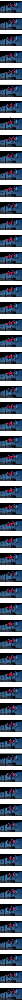

In [ ]:
import matplotlib.pyplot as plt

# Define the number of rows and columns for subplots
num_rows = len(rendered_img_array)
num_cols = 1

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(8, 6*num_rows))

# Plot each image
for i in range(num_rows):
    axes[i].imshow(rendered_img_array[i])
    axes[i].set_title(f'Image {i+1}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import shutil
import os

# Specify the folder containing the images
folder_path = '/content/enhanced_images'

# Zip the folder
shutil.make_archive('/content/enhanced_images', 'zip', folder_path)

# Download the zip file to local desktop
from google.colab import files
files.download('/content/enhanced_images.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Step 5: Novel View Synthesis 🖼️

In [ ]:
# Render novel views from a sprial camera trajectory.
# The spiral trajectory generation function is modified from https://github.com/kwea123/nerf_pl.
from nerfmm.utils.pose_utils import create_spiral_poses

# Render full images are time consuming, especially on colab so we render a smaller version instead.
resize_ratio = 1
with torch.no_grad():
    optimised_poses = torch.stack([pose_param_net(i) for i in range(N_IMGS)])
    radii = np.percentile(np.abs(optimised_poses.cpu().numpy()[:, :3, 3]), q=50, axis=0)  # (3,)
    spiral_c2ws = create_spiral_poses(radii, focus_depth=3.5, n_poses=30, n_circle=1)
    spiral_c2ws = torch.from_numpy(spiral_c2ws).float()  # (N, 3, 4)

    # change intrinsics according to resize ratio
    fxfy = focal_net()
    novel_fxfy = fxfy / resize_ratio
    novel_H, novel_W = H // resize_ratio, W // resize_ratio

    print('NeRF trained in {0:d} x {1:d} for {2:d} epochs'.format(H, W, N_EPOCH))
    print('Rendering novel views in {0:d} x {1:d}'.format(novel_H, novel_W))

    novel_img_list, novel_depth_list = [], []
    for i in tqdm(range(spiral_c2ws.shape[0]), desc='novel view rendering'):
        novel_img, novel_depth = render_novel_view(spiral_c2ws[i], novel_H, novel_W, novel_fxfy,
                                                   ray_params, nerf_model)
        novel_img_list.append(novel_img)
        novel_depth_list.append(novel_depth)

    print('Novel view rendering done. Saving to GIF images...')
    novel_img_list = (torch.stack(novel_img_list) * 255).cpu().numpy().astype(np.uint8)
    novel_depth_list = (torch.stack(novel_depth_list) * 200).cpu().numpy().astype(np.uint8)  # depth is always in 0 to 1 in NDC

    os.makedirs('nvs_results', exist_ok=True)
    imageio.mimwrite(os.path.join('nvs_results', scene_name + '_img.gif'), novel_img_list, fps=30)
    imageio.mimwrite(os.path.join('nvs_results', scene_name + '_depth.gif'), novel_depth_list, fps=30)
    print('GIF images saved.')

NeRF trained in 480 x 848 for 2000 epochs
Rendering novel views in 480 x 848


novel view rendering:   0%|          | 0/30 [00:00<?, ?it/s]

Novel view rendering done. Saving to GIF images...
GIF images saved.


In [ ]:
Image(open(os.path.join('rendered_images.gif'), 'rb').read())

In [ ]:
Image(open(os.path.join('nvs_results', scene_name + '_depth.gif'), 'rb').read())